# Análisis de datos de COVID-19 con Python

Este notebook simplemente quiere describir algunas formas de análisis de datos, y para ello se ha basado en datos públicos sobre la pandemia de COVID-19. Su objetivo es simplemente académico, y no es un análisis real.

Para poder realizar el análisis simple de los datos, en primer lugar hay que realizar las importaciones de librerias necesarias.

> Aquí se realiza la importación general que se utiliza en el resto del notebook, pero en otras celdas se realizan importaciones adicionales

In [1]:
import requests
import matplotlib.pyplot as plt

Se realiza la carga de los datos desde una fuente pública, que está filtrada y devuelve la información en formato JSON.

[COVID19 API](https://pomber.github.io/covid19/timeseries.json)

La información que devuelve esta fuente es del mundo entero, indicando el nombre de cada país, y la información por fechas.

``` JSON
{
  "Spain": [
    {
      "date": "2020-1-22",
      "confirmed": 2,
      "deaths": 0,
      "recovered": 0
    },
    {
      "date": "2020-1-23",
      "confirmed": 3,
      "deaths": 0,
      "recovered": 0
    },
    ...
  ],
  ...
}
```

In [3]:
response = requests.get("https://pomber.github.io/covid19/timeseries.json")
data = response.json()

print(data)

{'Afghanistan': [{'date': '2020-1-22', 'confirmed': 0, 'deaths': 0, 'recovered': 0}, {'date': '2020-1-23', 'confirmed': 0, 'deaths': 0, 'recovered': 0}, {'date': '2020-1-24', 'confirmed': 0, 'deaths': 0, 'recovered': 0}, {'date': '2020-1-25', 'confirmed': 0, 'deaths': 0, 'recovered': 0}, {'date': '2020-1-26', 'confirmed': 0, 'deaths': 0, 'recovered': 0}, {'date': '2020-1-27', 'confirmed': 0, 'deaths': 0, 'recovered': 0}, {'date': '2020-1-28', 'confirmed': 0, 'deaths': 0, 'recovered': 0}, {'date': '2020-1-29', 'confirmed': 0, 'deaths': 0, 'recovered': 0}, {'date': '2020-1-30', 'confirmed': 0, 'deaths': 0, 'recovered': 0}, {'date': '2020-1-31', 'confirmed': 0, 'deaths': 0, 'recovered': 0}, {'date': '2020-2-1', 'confirmed': 0, 'deaths': 0, 'recovered': 0}, {'date': '2020-2-2', 'confirmed': 0, 'deaths': 0, 'recovered': 0}, {'date': '2020-2-3', 'confirmed': 0, 'deaths': 0, 'recovered': 0}, {'date': '2020-2-4', 'confirmed': 0, 'deaths': 0, 'recovered': 0}, {'date': '2020-2-5', 'confirmed': 0

Los datos que se obtienen contienen la información de cada uno de los países, si se quiere estudiar los casos de España solamente, es necesario filtrarlos.

In [4]:
#spain = list(v for k,v in data.items() if k == "Spain")
spain = None
for k,v in data.items():
    if k == "Spain":
        spain = v
        break

assert(not spain is None)

Con los datos de España en una lista de elementos, se van a dividir en varias listas individuales de información, para poder realizar una representación gráfica de los mismos.

En este bloque se va a aprovechar en filtrar los datos que no contienen información relevante, para reducir la cantidad de los mismos.

In [5]:
import datetime as dt

dates = list()
confirmed = list()
deaths = list()
recovered = list()
hasdata = False
for item in spain:
    if item['confirmed'] == 0 and item['deaths'] == 0 and item['recovered'] == 0:
        if hasdata == False:
            continue 

    hasdata = True
    dates.append(dt.datetime.strptime(item['date'], '%Y-%m-%d'))
    #dates.append(item['date'])
    confirmed.append(item['confirmed'])
    deaths.append(item['deaths'])
    recovered.append(item['recovered'])

print(dates)

[datetime.datetime(2020, 2, 1, 0, 0), datetime.datetime(2020, 2, 2, 0, 0), datetime.datetime(2020, 2, 3, 0, 0), datetime.datetime(2020, 2, 4, 0, 0), datetime.datetime(2020, 2, 5, 0, 0), datetime.datetime(2020, 2, 6, 0, 0), datetime.datetime(2020, 2, 7, 0, 0), datetime.datetime(2020, 2, 8, 0, 0), datetime.datetime(2020, 2, 9, 0, 0), datetime.datetime(2020, 2, 10, 0, 0), datetime.datetime(2020, 2, 11, 0, 0), datetime.datetime(2020, 2, 12, 0, 0), datetime.datetime(2020, 2, 13, 0, 0), datetime.datetime(2020, 2, 14, 0, 0), datetime.datetime(2020, 2, 15, 0, 0), datetime.datetime(2020, 2, 16, 0, 0), datetime.datetime(2020, 2, 17, 0, 0), datetime.datetime(2020, 2, 18, 0, 0), datetime.datetime(2020, 2, 19, 0, 0), datetime.datetime(2020, 2, 20, 0, 0), datetime.datetime(2020, 2, 21, 0, 0), datetime.datetime(2020, 2, 22, 0, 0), datetime.datetime(2020, 2, 23, 0, 0), datetime.datetime(2020, 2, 24, 0, 0), datetime.datetime(2020, 2, 25, 0, 0), datetime.datetime(2020, 2, 26, 0, 0), datetime.datetime(20

Una vez con los datos filtrados, sólo es necesario empezar a mostrarlos de las distintas formas deseadas.

Tal y como se ha indicado anteriormente, el objetivo de este notebook es simplemente mostrar distintas fases de una análisis de datos real, pero no se tiene ningún objetivo claro de obtención de información.

Para poder mostrar los gráficos se utiliza una libreria muy común en Python [mathplotlib](https://matplotlib.org/). Es una libreria muy amplia y completa, aquí solo vamos a mostrar un ejemplo práctico de uso.

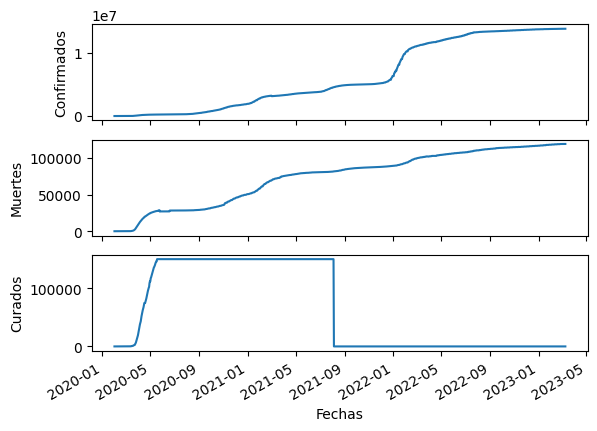

In [6]:
import matplotlib.dates as mdates

fig, axs = plt.subplots(3,1)
axs[0].plot(dates, confirmed)
axs[0].set_xlabel('Fechas')
axs[0].set_ylabel('Confirmados')

axs[1].plot(dates, deaths)
axs[1].set_xlabel('Fechas')
axs[1].set_ylabel('Muertes')

axs[2].plot(dates, recovered)
axs[2].set_xlabel('Fechas')
axs[2].set_ylabel('Curados')

fig.autofmt_xdate()
axs[0].fmt_xdata = mdates.DateFormatter('%d-%m')
plt.show()

Tambien es posible mostrar las tres series de datos en una misma gráfica, aunque la escala de cada conjunto de datos puede afectar al resultado final.

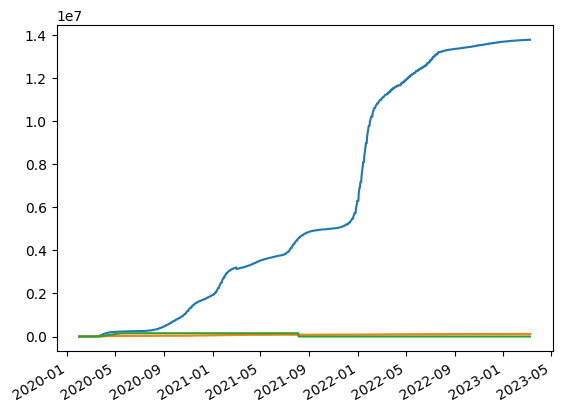

In [7]:
import matplotlib.dates as mdates

fig, ax = plt.subplots(1)
ax.plot(dates, confirmed, dates, deaths, dates, recovered)
fig.autofmt_xdate()
ax.fmt_xdata = mdates.DateFormatter('%d-%m')
plt.show()

## Otras librerias útiles

Todas las operaciones de filtrado y tratamiento de la información, es posible realizarlas de una forma más sencilla con librerias de tratamiento de información. Una de las más conocidas es [pandas](https://pandas.pydata.org/). Esta libreria reduce significativamente el código.

In [15]:
import pandas as pd
response = requests.get("https://pomber.github.io/covid19/timeseries.json")
data = response.json()

df = pd.DataFrame(data['Spain'])
with open ('DataCOVID19.txt', 'w') as fsave: #Tengo que ver cómo hacer esto. No funciona
    #for row in df:
    fsave = df    
print(df)

           date  confirmed  deaths  recovered
0     2020-1-22          0       0          0
1     2020-1-23          0       0          0
2     2020-1-24          0       0          0
3     2020-1-25          0       0          0
4     2020-1-26          0       0          0
...         ...        ...     ...        ...
1138   2023-3-5   13770429  119479          0
1139   2023-3-6   13770429  119479          0
1140   2023-3-7   13770429  119479          0
1141   2023-3-8   13770429  119479          0
1142   2023-3-9   13770429  119479          0

[1143 rows x 4 columns]


<Axes: xlabel='date'>

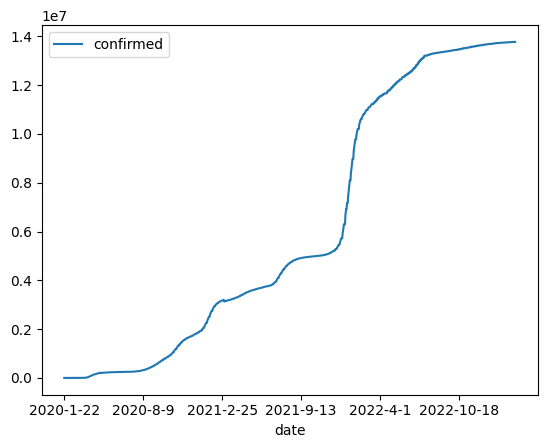

In [10]:
df.plot(x='date', y='confirmed')

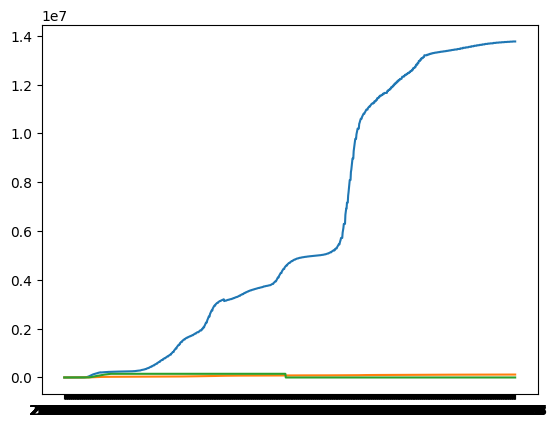

In [12]:
plt.plot('date', 'confirmed', data = df, label='Confirmados')
plt.plot('date', 'deaths', data = df, label='Muertes')
plt.plot('date', 'recovered', data = df, label='Curados')
plt.legend()
plt.show()

Referencia adicional:
Para un ejemplo de análisis más completo, aunque con datos de India, utilizar la siguiente referencia:
https://towardsdatascience.com/tracking-corona-covid-19-spread-in-india-using-python-40ef8ffa7e31
